# Basic plotting with pandas and Matplotlib

## Basic XY Plot

In [4]:
import pandas as pd

In [5]:
#define absolute file path
fp = 'C:/Users/Joe/Documents/PYTHON/GEOPYTHON/data/029740.txt'

In [6]:
data = pd.read_csv(fp, 
                   delim_whitespace=True, 
                   na_values=["*", "**", "***", "****", "*****", "******"],
                   usecols=["YR--MODAHRMN", "TEMP", "MAX", "MIN"],
                   parse_dates=["YR--MODAHRMN"], #convert dates to date time
                   index_col="YR--MODAHRMN", #sets date as index
)

So what’s different here? Well, we have added two new parameters: parse_dates and index_col.

- parse_dates takes a Python list of column name(s) containing date data that Pandas will parse and convert to the datetime data type. For many common date formats this parameter will automatically recognize and convert the date data.

- index_col is used to state a column that should be used to index the data in the DataFrame. In this case, we end up with our date data as the DataFrame index. This is a very useful feature in Pandas as we’ll see below.

In [7]:
data.head()

,TEMP,MAX,MIN
YR--MODAHRMN,,,
1952-01-01 00:00:00,36.0,NaN,NaN
1952-01-01 06:00:00,37.0,NaN,34.0
1952-01-01 12:00:00,39.0,NaN,NaN
1952-01-01 18:00:00,36.0,39.0,NaN
1952-01-02 00:00:00,36.0,NaN,NaN


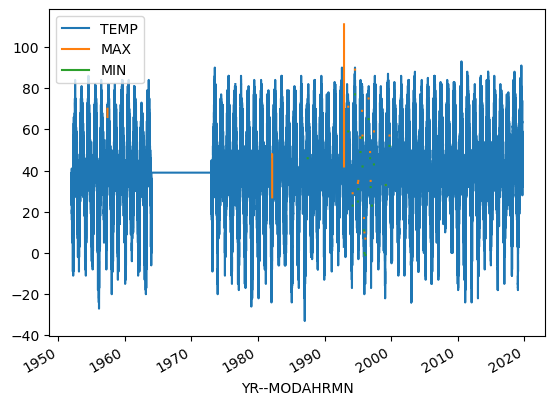

In [8]:
ax = data.plot()

In [9]:
type(ax)

matplotlib.axes._subplots.AxesSubplot

In [10]:
#observations of Oct 2019
oct1_temps = data['TEMP'].loc[data.index >= '201910011200']

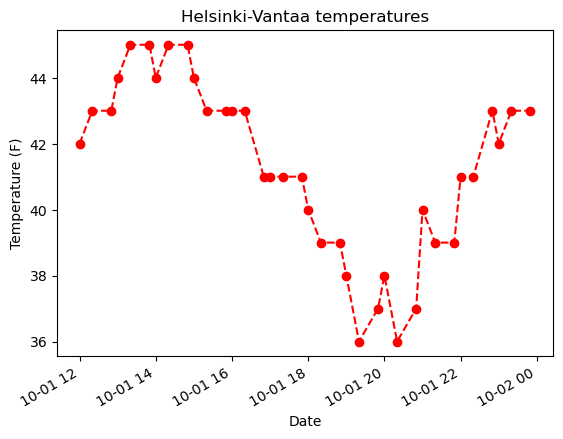

In [11]:
#change line and symbol format
ax = oct1_temps.plot(
    style='ro--', #color, marker, line tyle
    title='Helsinki-Vantaa temperatures',
    xlabel='Date',
    ylabel='Temperature (F)',
)

check link to get to know about formatting
https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.line.html#pandas.DataFrame.plot.line

In [12]:
#to get more info - help(oct1_temps.plot)

## Enlarge the plot

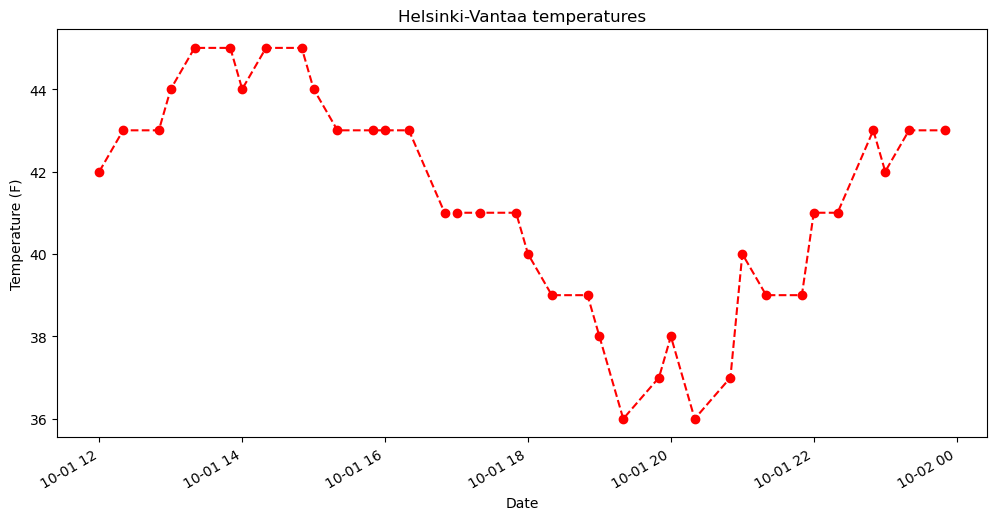

In [13]:
#adjust the figure size
ax = oct1_temps.plot(
    style='ro--', #color, marker, line tyle
    title='Helsinki-Vantaa temperatures',
    xlabel='Date',
    ylabel='Temperature (F)',
    figsize=(12, 6), #12x6 inches
)

It is also possible to change the default figure size for all figures in a Jupyter Notebook by importing the pyplot module from matplotlib (i.e., import matplotlib.pyplot as plt)and then defining the default figure size using plt.rcParams['figure.figsize'] = [12, 6]. In this case the figure size should be given as a Python list.

**Other common plot formatting operations**
- Adding text to the plot
    - Adding text to plots can be done using ax.text().
        - ax.text(x, y, 'Text to display')
     - This would display “Text to display” at the location x, y on the plot. We’ll see how to do this in a live example in just a second.


- Changing the axis ranges
    - Changing the plot axes can be done using the xlim and ylim parameters of the plot() function
        - df.plot(xlim=[xmin, xmax], ylim=[ymin, ymax])
    - Where xmin should be the minimum bound of the x-axis, xmax should be the maximum bound, and the same goes for the y-axis with ymin and ymax.

## Dealing with datetime axes

In [14]:
#converting string to datetime
pd.to_datetime('202303151020')

Timestamp('2023-03-15 10:20:00')

Text(2019-10-01 12:05:00, 42.0, '<- coldest temperature')

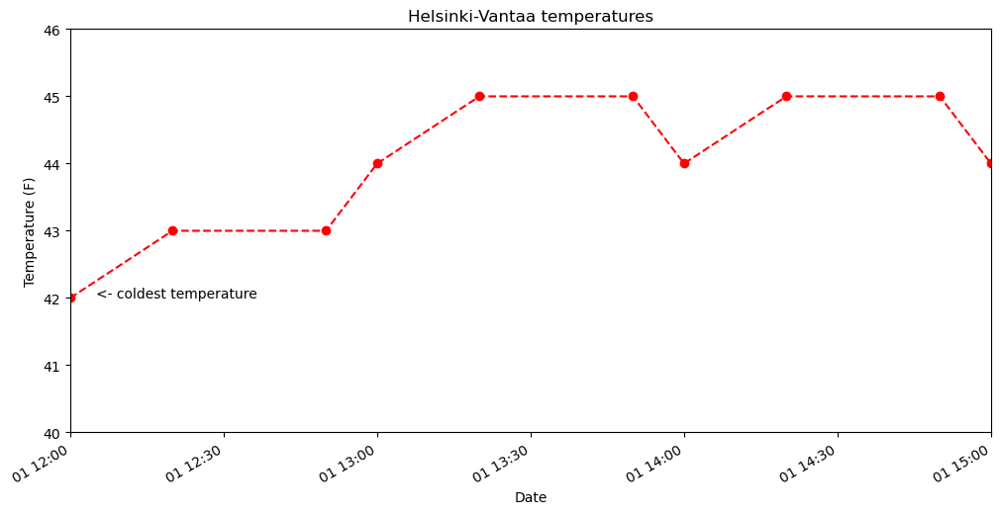

In [15]:
#limiting the time range
#Define start, end and cold times
start_time = pd.to_datetime('201910011200')
end_time = pd.to_datetime('201910011500')
cold_time = pd.to_datetime('201910011205')

#create the plot
ax = oct1_temps.plot(
    style='ro--', #color, marker, line tyle
    title='Helsinki-Vantaa temperatures',
    xlabel='Date',
    ylabel='Temperature (F)',
    figsize=(12, 6), #12x6 inches
    xlim=[start_time, end_time],
    ylim=[40,46], #temp range we want
)

#add text to display the coldest temp
ax.text(cold_time, 42.0, '<- coldest temperature')

Create a line plot similar to our examples above with the following attributes:
- Temperature data from 18:00-24:00 on October 1, 2019
- A dotted black line connecting the observations (do not show the data points)
- A title that reads “Evening temperatures on October 1, Helsinki-Vantaa”
- A text label indicating the warmest temperature in the evening

In [16]:
oct1_temps.head()

YR--MODAHRMN
2019-10-01 12:00:00    42.0
2019-10-01 12:20:00    43.0
2019-10-01 12:50:00    43.0
2019-10-01 13:00:00    44.0
2019-10-01 13:20:00    45.0
Name: TEMP, dtype: float64

Text(2019-10-01 22:00:00, 43.0, 'Warmest time -->')

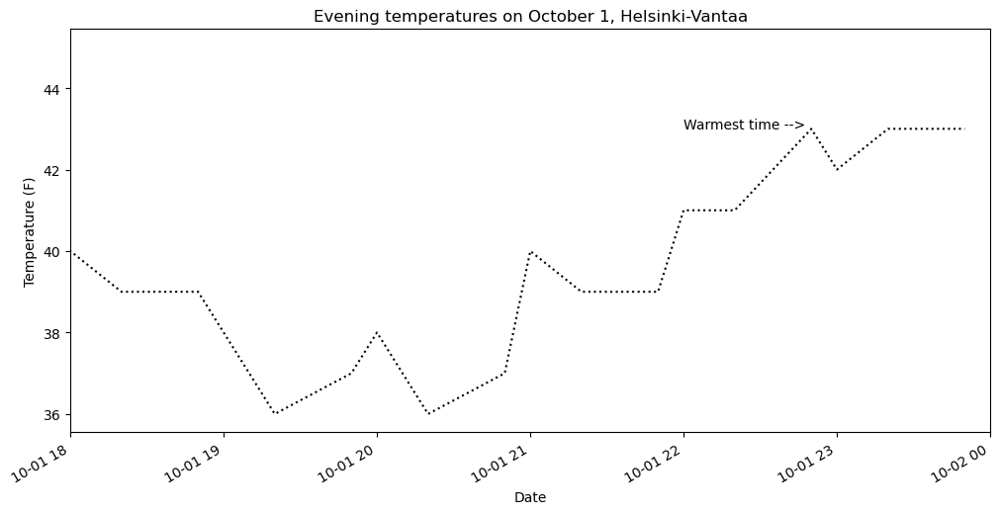

In [17]:
#define start, end and warm time
start_time = pd.to_datetime('201910011800')
end_time = pd.to_datetime('201910020000')
warm_time = pd.to_datetime('201910012200')

#create the plot
ax = oct1_temps.plot(
    style='k:',
    title='Evening temperatures on October 1, Helsinki-Vantaa',
    xlabel='Date',
    ylabel='Temperature (F)',
    figsize=(12, 6),
    xlim=[start_time, end_time],
)

#add text
ax.text(warm_time, 43.0, 'Warmest time -->')

## Bar plots

Text(0, 42.1, 'Coldest \ntemp \nv')

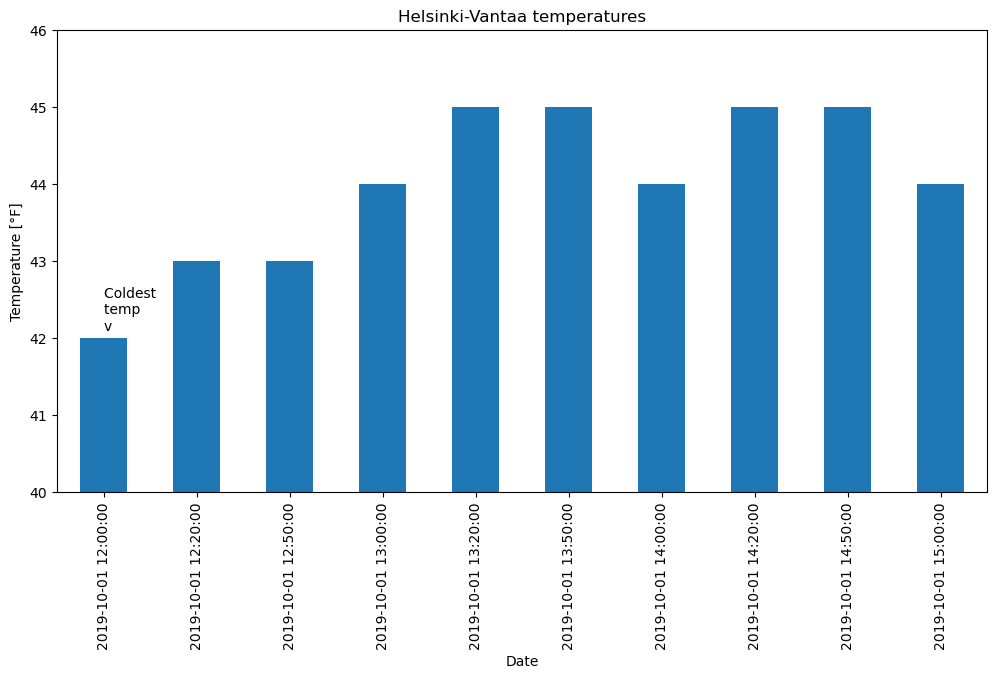

In [18]:
# Define time range
oct1_afternoon = oct1_temps.loc[oct1_temps.index <= "201910011500"]

# Create bar plot
ax = oct1_afternoon.plot(
    kind="bar", #to indicate that its a bar plot
    title="Helsinki-Vantaa temperatures",
    xlabel="Date",
    ylabel="Temperature [°F]",
    figsize=(12, 6),
    ylim=[40, 46],
)

# Add plot text
ax.text(0, 42.1, "Coldest \ntemp \nv")

## Saving your plots as image files

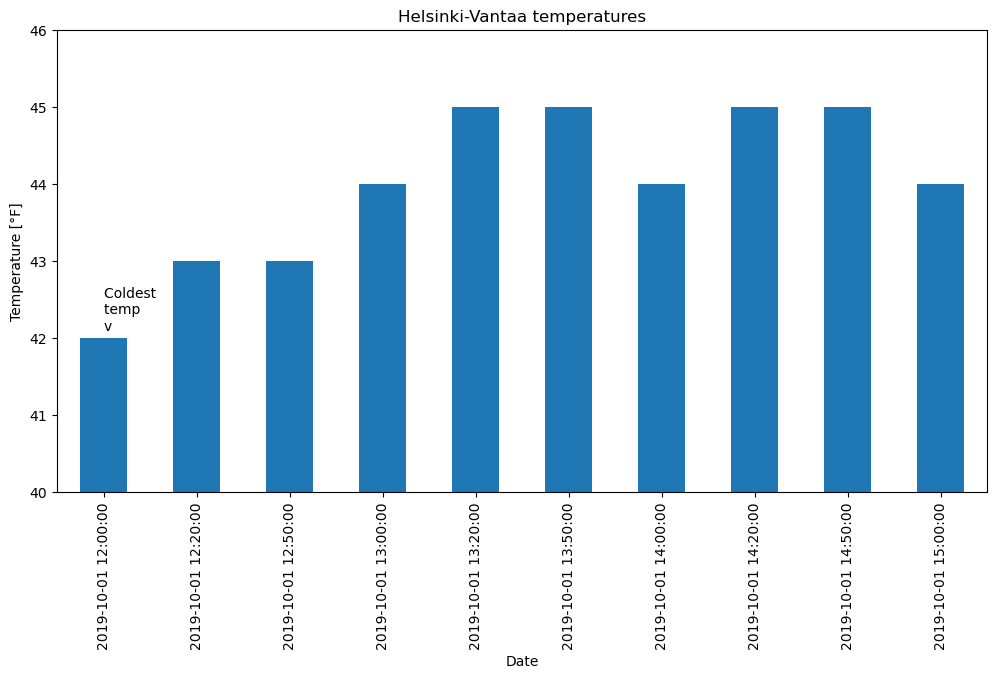

In [19]:
#import matplotlib
import matplotlib.pyplot as plt

# Create bar plot
ax = oct1_afternoon.plot(
    kind="bar",
    title="Helsinki-Vantaa temperatures",
    xlabel="Date",
    ylabel="Temperature [°F]",
    figsize=(12, 6),
    ylim=[40, 46],
)

# Add plot text
ax.text(0, 42.1, "Coldest \ntemp \nv")

# Save plot to file
plt.savefig("bar-plot.png") #you can do jpg, jpeg etc

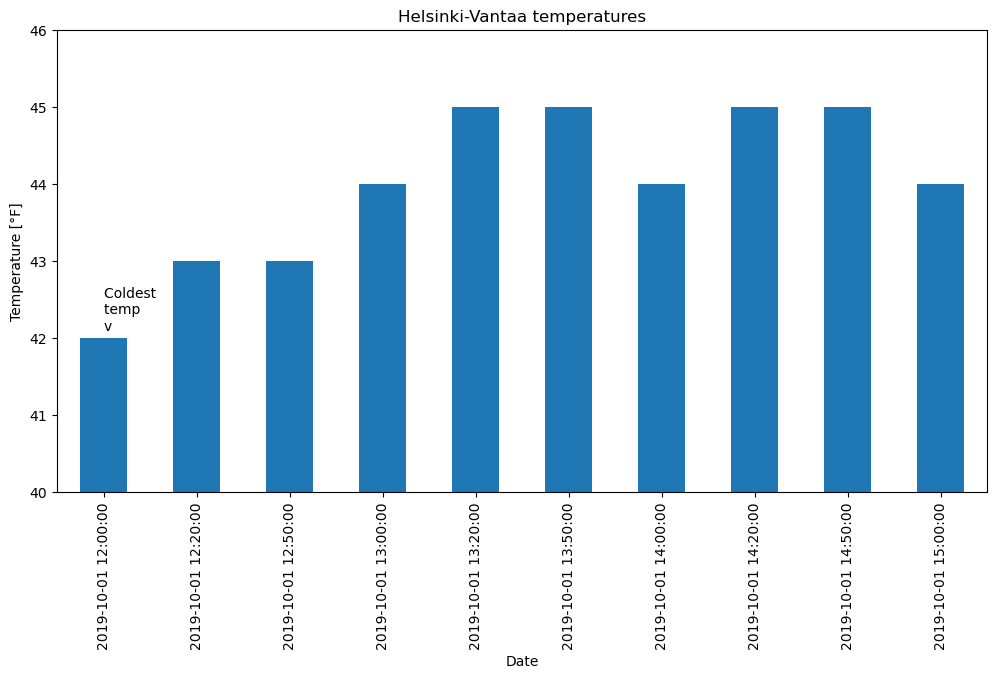

In [20]:
#saving as high resolution
# Create bar plot
ax = oct1_afternoon.plot(
    kind="bar",
    title="Helsinki-Vantaa temperatures",
    xlabel="Date",
    ylabel="Temperature [°F]",
    figsize=(12, 6),
    ylim=[40, 46],
)

# Add plot text
ax.text(0, 42.1, "Coldest \ntemp \nv")

# Save plot to file (high resolution, PDF)
plt.savefig("bar-plot-hi-res.pdf", dpi=600)

## Interactive plotting

One of the cool things in Jupyter notebooks is that our plots need not be static. We can easily create plots that are interactive, allowing us to view data values by mousing over them, or to click to enable/disable plotting of some data. There are libraries we could use to do this, but we’ll use the hvPlot plotting API, which allows us to create interactive plots with little additional effort.

hvPlot is a high-level plotting package that can accept several different common Python data types and plot them using using the bokeh visualization library. The great thing with hvPlot is that it takes almost no effort to move from plotting in pandas to creating interactive plots.

To get started, we need to import the pandas submodule of hvPlot.
http://bokeh.org/
https://hvplot.holoviz.org/

In [21]:
import hvplot.pandas

In [22]:
july2014_df = data.loc[(data.index >= "201407010000") & (data.index < "201407310000")]

july2014_df.hvplot(
    title="Helsinki-Vantaa temperatures",
    xlabel="Date",
    ylabel="Temperature [°F]",
    ylim=[45.0, 90.0],
)

:NdOverlay   [Variable]
   :Curve   [YR--MODAHRMN]   (value)

# More advanced plotting with pandas/Matplotlib

## Loading

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

In [24]:
data.head()

,TEMP,MAX,MIN
YR--MODAHRMN,,,
1952-01-01 00:00:00,36.0,NaN,NaN
1952-01-01 06:00:00,37.0,NaN,34.0
1952-01-01 12:00:00,39.0,NaN,NaN
1952-01-01 18:00:00,36.0,39.0,NaN
1952-01-02 00:00:00,36.0,NaN,NaN


In [25]:
print(f"Number of rows: {len(data)}")

Number of rows: 931767


In [26]:
#rename columns
new_names = {'TEMP': 'TEMP_F'}
data = data.rename(columns=new_names)
data.head()

,TEMP_F,MAX,MIN
YR--MODAHRMN,,,
1952-01-01 00:00:00,36.0,NaN,NaN
1952-01-01 06:00:00,37.0,NaN,34.0
1952-01-01 12:00:00,39.0,NaN,NaN
1952-01-01 18:00:00,36.0,39.0,NaN
1952-01-02 00:00:00,36.0,NaN,NaN


## Data Prep

In [27]:
#check missing data values
print(f'Number of missing data values per column:\n{data.isna().sum()}')

Number of missing data values per column:
TEMP_F      3579
MAX       900880
MIN       900896
dtype: int64


In [28]:
#discard missing values
data.dropna(subset='TEMP_F', inplace=True)

In [29]:
len(data)

928188

In [30]:
data['TEMP_C'] = (data['TEMP_F'] - 32.0) / 1.8
data.head()

,TEMP_F,MAX,MIN,TEMP_C
YR--MODAHRMN,,,,
1952-01-01 00:00:00,36.0,NaN,NaN,2.222222
1952-01-01 06:00:00,37.0,NaN,34.0,2.777778
1952-01-01 12:00:00,39.0,NaN,NaN,3.888889
1952-01-01 18:00:00,36.0,39.0,NaN,2.222222
1952-01-02 00:00:00,36.0,NaN,NaN,2.222222


## Using Subplots

**Extracting seasonal temperatures**

Let’s now select data from different seasons of the year in 2012/2013:
- Winter (December 2012 - February 2013)
- Spring (March 2013 - May 2013)
- Summer (June 2013 - August 2013)
- Autumn (Septempber 2013 - November 2013)


In [31]:
winter = data.loc[(data.index >= '201212010000') & (data.index < '201303010000')]
winter_temps = winter['TEMP_C']

spring = data.loc[(data.index >= "201303010000") & (data.index < "201306010000")]
spring_temps = spring["TEMP_C"]

summer = data.loc[(data.index >= "201306010000") & (data.index < "201309010000")]
summer_temps = summer["TEMP_C"]

autumn = data.loc[(data.index >= "201309010000") & (data.index < "201312010000")]
autumn_temps = autumn["TEMP_C"]

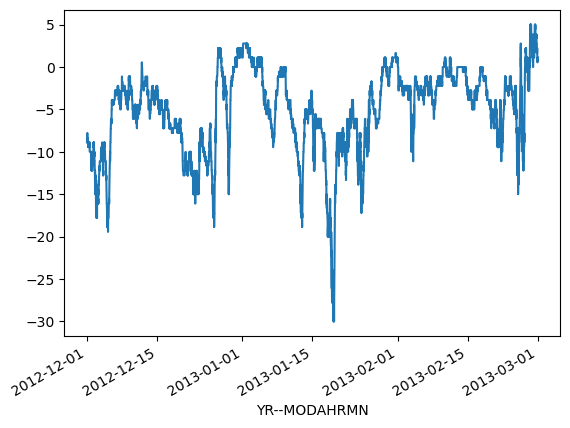

In [32]:
#WINTER plot
ax1 = winter_temps.plot()

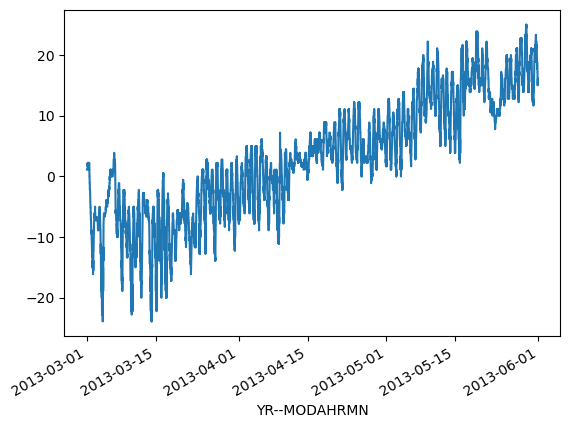

In [33]:
#spring plot
ax2 = spring_temps.plot()

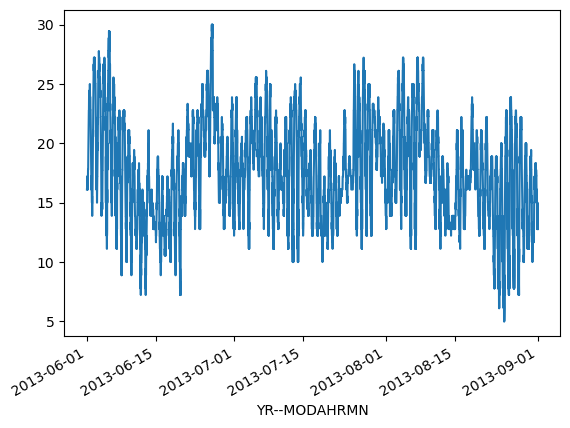

In [34]:
ax3 = summer_temps.plot()

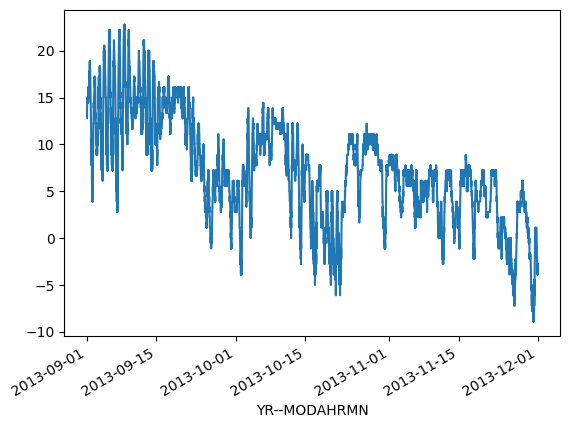

In [35]:
ax4 = autumn_temps.plot()

In [36]:
#find minimum seasonal temp
min_temp = min(
    winter_temps.min(), spring_temps.min(), summer_temps.min(), autumn_temps.min()
)

#cretae a lower temp for putting on the axis
min_temp = min_temp - 5.0

# Find upper limit for y-axis
max_temp = max(
    winter_temps.max(), spring_temps.max(), summer_temps.max(), autumn_temps.max()
)
max_temp = max_temp + 5.0

#print y-axis min and max
print(f"Min: {min_temp}, Max: {max_temp}")

Min: -35.0, Max: 35.0


## Create first set of subplots

array([[<AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

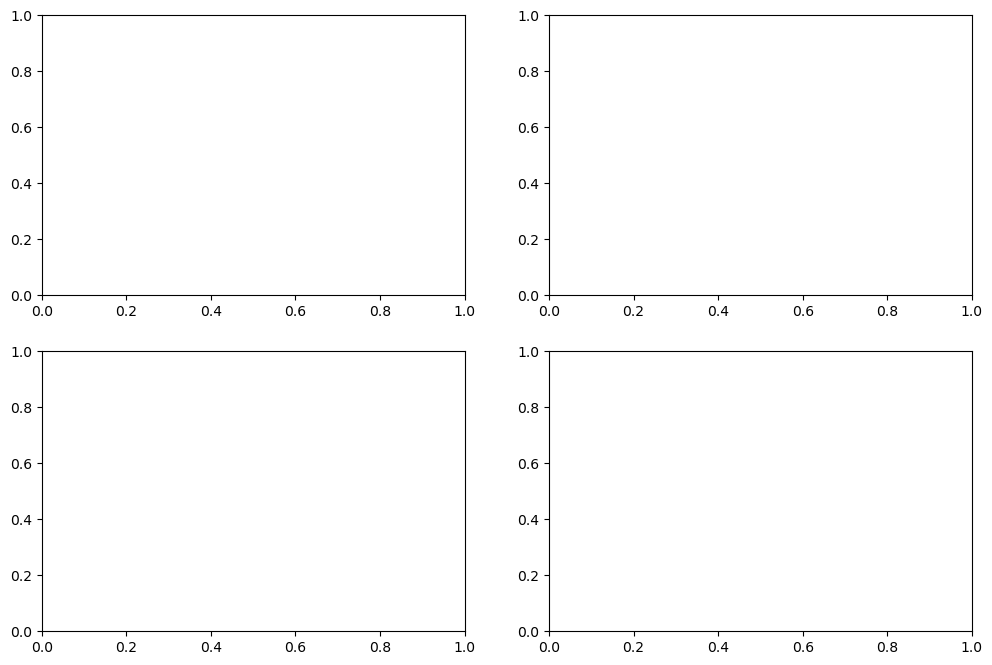

In [37]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8)) #you can do (2,2, figsize)
axes

In [38]:
#referring to each individual plot
ax11 = axes[0][0]
ax12 = axes[0][1]
ax21 = axes[1][0]
ax22 = axes[1][1]

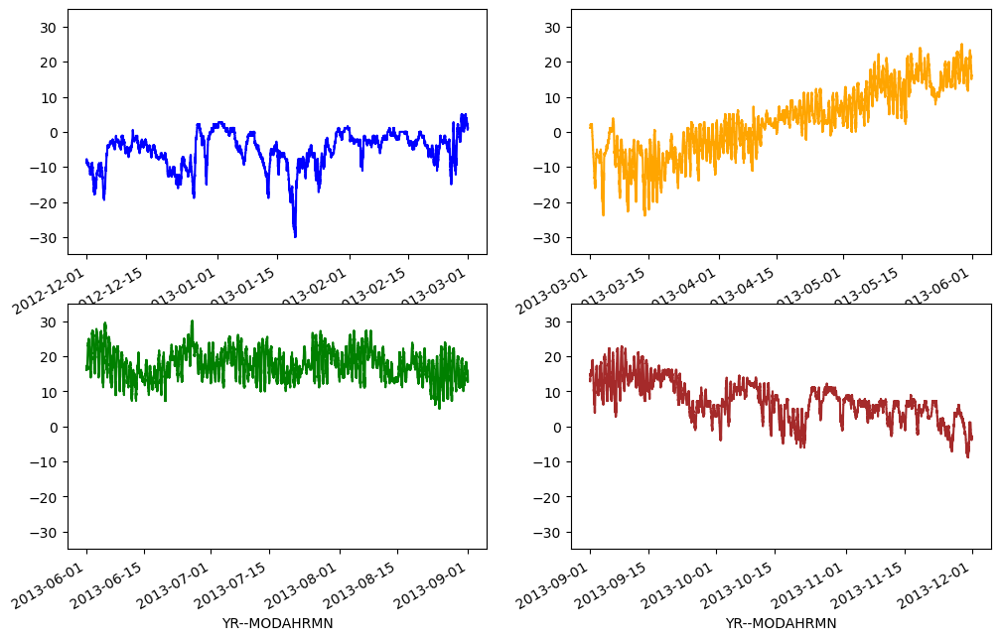

In [39]:
#plot the seasonal data
#set plot line width
line_width = 1.5

#plot data
#winter
winter_temps.plot(ax=ax11, c='blue', lw=line_width, ylim=[min_temp, max_temp])
#spring
spring_temps.plot(ax=ax12, c="orange", lw=line_width, ylim=[min_temp, max_temp])
#summer
summer_temps.plot(ax=ax21, c="green", lw=line_width, ylim=[min_temp, max_temp])
#autumn
autumn_temps.plot(ax=ax22, c="brown", lw=line_width, ylim=[min_temp, max_temp])

# Display the figure
fig

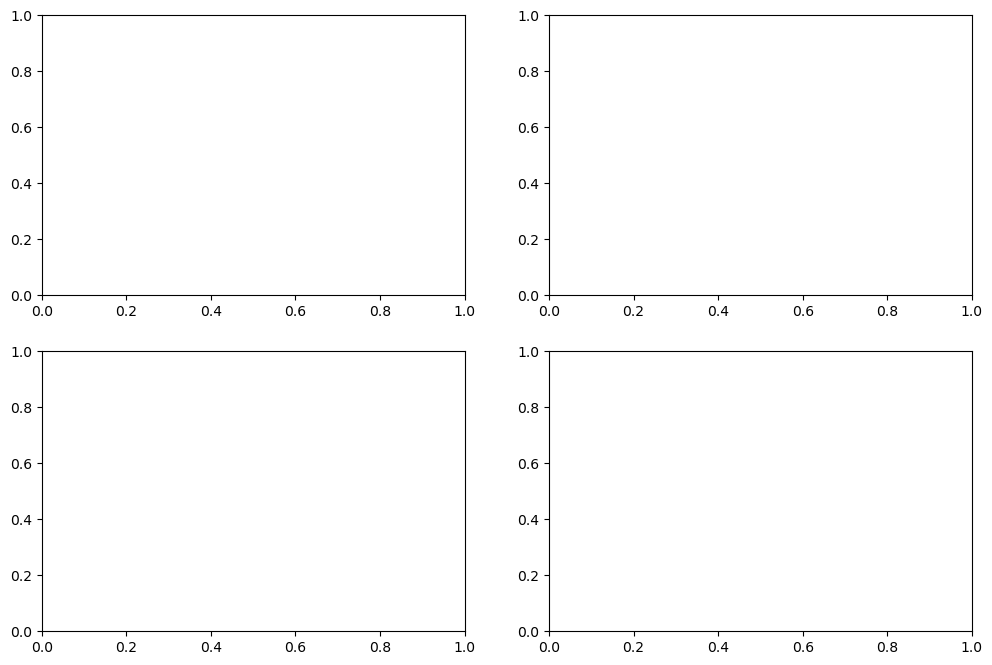

In [40]:
# Create the new figure and subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Rename the axes for ease of use
ax11 = axes[0][0]
ax12 = axes[0][1]
ax21 = axes[1][0]
ax22 = axes[1][1]

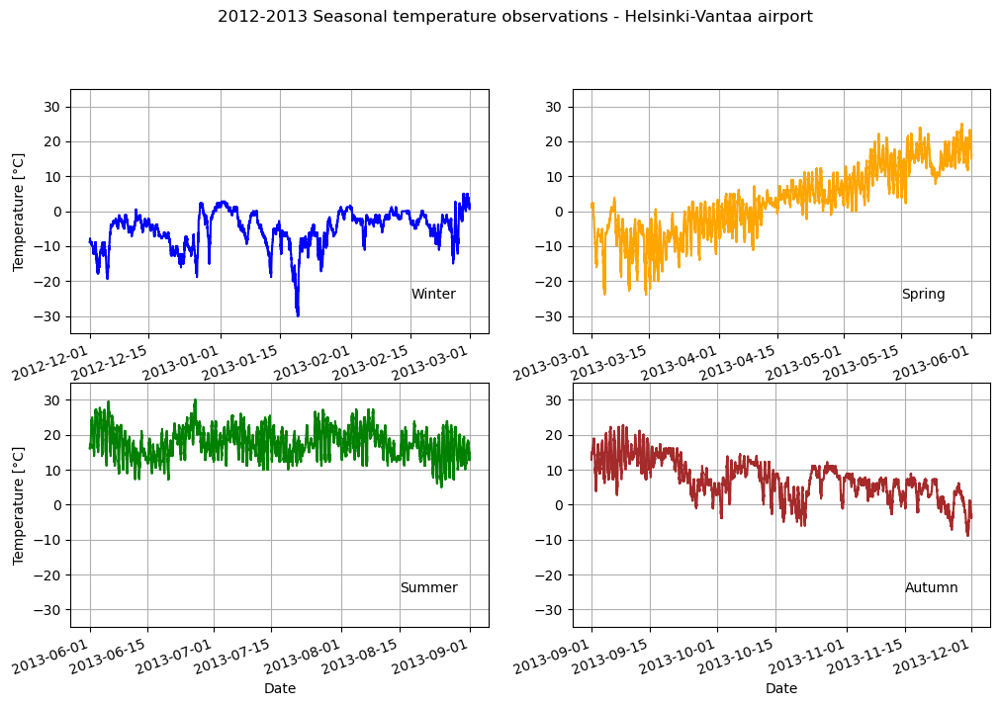

In [41]:
# Set plot line width
line_width = 1.5

# Plot data
winter_temps.plot(
    ax=ax11, c="blue", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
spring_temps.plot(
    ax=ax12, c="orange", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
summer_temps.plot(
    ax=ax21, c="green", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
autumn_temps.plot(
    ax=ax22, c="brown", lw=line_width, ylim=[min_temp, max_temp], grid=True
)

# Set figure title
fig.suptitle("2012-2013 Seasonal temperature observations - Helsinki-Vantaa airport")

# Rotate the x-axis labels so they don't overlap
plt.setp(ax11.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax12.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax21.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax22.xaxis.get_majorticklabels(), rotation=20)

# Axis labels
ax21.set_xlabel("Date")
ax22.set_xlabel("Date")
ax11.set_ylabel("Temperature [°C]")
ax21.set_ylabel("Temperature [°C]")

# Season label text
ax11.text(pd.to_datetime("20130215"), -25, "Winter")
ax12.text(pd.to_datetime("20130515"), -25, "Spring")
ax21.text(pd.to_datetime("20130815"), -25, "Summer")
ax22.text(pd.to_datetime("20131115"), -25, "Autumn")

# Display plot
fig

Text(2013-11-15 00:00:00, -25, 'Autumn')

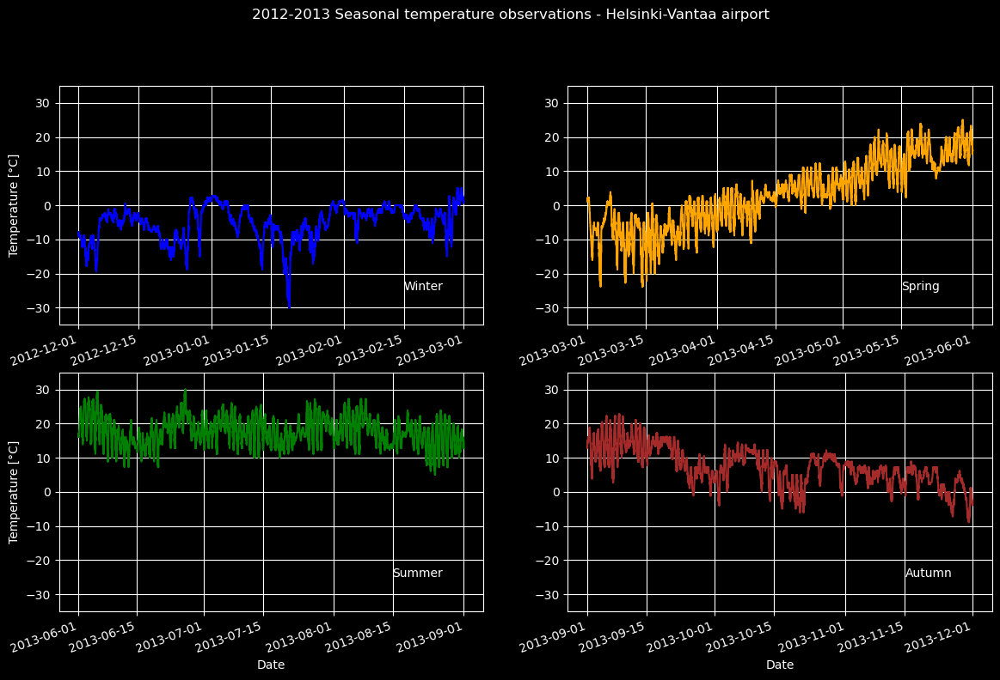

In [52]:
#you can change the overall style by using a dark background

plt.style.use("dark_background")

# Create the new figure and subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(14, 9))

# Rename the axes for ease of use
ax11 = axs[0][0]
ax12 = axs[0][1]
ax21 = axs[1][0]
ax22 = axs[1][1]

# Set plot line width
line_width = 1.5

# Plot data
winter_temps.plot(
    ax=ax11, c="blue", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
spring_temps.plot(
    ax=ax12, c="orange", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
summer_temps.plot(
    ax=ax21, c="green", lw=line_width, ylim=[min_temp, max_temp], grid=True
)
autumn_temps.plot(
    ax=ax22, c="brown", lw=line_width, ylim=[min_temp, max_temp], grid=True
)

# Set figure title
fig.suptitle("2012-2013 Seasonal temperature observations - Helsinki-Vantaa airport")

# Rotate the x-axis labels so they don't overlap
plt.setp(ax11.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax12.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax21.xaxis.get_majorticklabels(), rotation=20)
plt.setp(ax22.xaxis.get_majorticklabels(), rotation=20)

# Axis labels
ax21.set_xlabel("Date")
ax22.set_xlabel("Date")
ax11.set_ylabel("Temperature [°C]")
ax21.set_ylabel("Temperature [°C]")

# Season label text
ax11.text(pd.to_datetime("20130215"), -25, "Winter")
ax12.text(pd.to_datetime("20130515"), -25, "Spring")
ax21.text(pd.to_datetime("20130815"), -25, "Summer")
ax22.text(pd.to_datetime("20131115"), -25, "Autumn")

For more styles, check link:
    
https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html

# Exercise

## Problem 1
- The aim of this task is to create a simple scatter plot using random input values and random colors!

In [1]:
#Create an new data frame called data and add 1000 random numbers (of type float) into a new column x and another 1000 random numbers into a new column y
#import numpy and pandas
import numpy as np
import pandas as pd

In [2]:
#create dataframe with x,y and color values
data = pd.DataFrame()

In [3]:
#add x and y
data['x'] = np.random.rand(1000)
data['y'] = np.random.rand(1000)

In [4]:
data.head()

,x,y
0,0.908120,0.961752
1,0.147613,0.501261
2,0.689331,0.355578
3,0.974744,0.220039
4,0.785736,0.884168


In [5]:
#Create a variable colors in which you should store 1000 random values for the colors so that we get a little sweeter looking plot.
colors = np.random.rand(1000)
print(colors[0:10])

[0.47927829 0.87919799 0.28892395 0.33392082 0.47214283 0.28564448
 0.54019495 0.33028885 0.47457505 0.25551841]


<AxesSubplot:title={'center':'Candy'}, xlabel='X', ylabel='Y'>

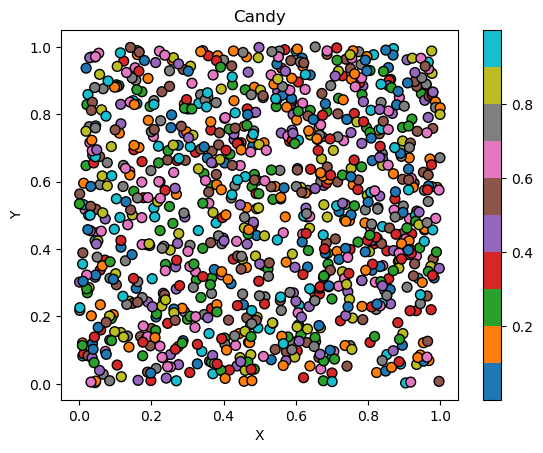

In [6]:
#create a scatter plot with the random points

data.plot.scatter(
    'x', 
    'y',
    title = 'Candy',
    xlabel = 'X',
    ylabel = 'Y',
    c = colors, #all colors from defined above
    cmap = 'tab10', #from matplotlib color map
    s = 50, #size
    edgecolor = 'black' #letter (k) can also be used
)

In [7]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Y')

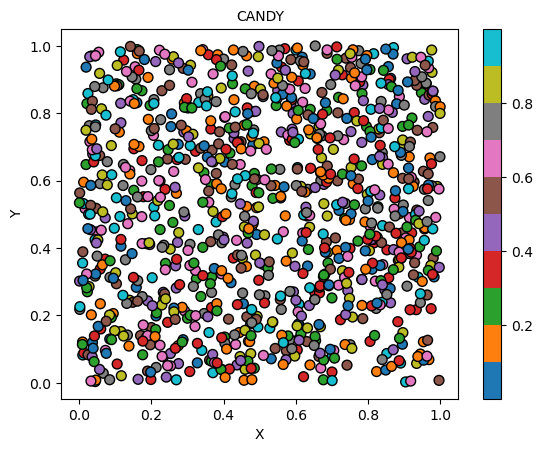

In [8]:
#create a scatter plot with the random points

data.plot.scatter(
    'x', 
    'y',
    c = colors, #all colors from defined above
    cmap = 'tab10', #from matplotlib color map
    s = 50, #size
    edgecolor = 'black' #letter (k) can also be used
)

#add labels
plt.title('CANDY', fontsize = 10)
plt.xlabel('X', fontsize = 10)
plt.ylabel('Y', fontsize = 10)

## Problem 2
- In this problem we will plot monthly mean temperatures from the Helsinki-Vantaa airpot for the past 30 years.

In [9]:
#import the data

data = pd.read_csv('helsinki-vantaa.csv',
                   parse_dates=['DATE'],
                   index_col='DATE'
)

data.head()

,USAF,TEMP_F,TEMP_C,REF_TEMP_C,DIFF_C
DATE,,,,,
1952-01-01,29740.0,28.347826,-2.028986,-4.93665,2.907665
1953-01-01,29740.0,22.190083,-5.449954,-4.93665,-0.513304
1954-01-01,29740.0,19.864407,-6.741996,-4.93665,-1.805346
1955-01-01,29740.0,22.583333,-5.231481,-4.93665,-0.294831
1956-01-01,29740.0,18.254237,-7.636535,-4.93665,-2.699885


In [10]:
len(data)

706

In [11]:
#Select data for the 30-year period (January 1988 to December 2018).
selection = data.loc[(data.index >= '19880101') & (data.index <= '20181231')]

selection.head()

,USAF,TEMP_F,TEMP_C,REF_TEMP_C,DIFF_C
DATE,,,,,
1988-01-01,29740.0,27.404003,-2.553332,-4.93665,2.383318
1989-01-01,29740.0,31.553337,-0.248146,-4.93665,4.688504
1990-01-01,29740.0,25.030890,-3.871728,-4.93665,1.064922
1991-01-01,29740.0,26.592345,-3.004253,-4.93665,1.932397
1992-01-01,29740.0,29.107965,-1.606686,-4.93665,3.329964


In [12]:
selection.tail()

,USAF,TEMP_F,TEMP_C,REF_TEMP_C,DIFF_C
DATE,,,,,
2014-12-01,29740.0,30.328862,-0.928410,-3.108102,2.179692
2015-12-01,29740.0,35.899190,2.166217,-3.108102,5.274318
2016-12-01,29740.0,30.536970,-0.812794,-3.108102,2.295308
2017-12-01,29740.0,33.445045,0.802803,-3.108102,3.910905
2018-12-01,29740.0,28.632289,-1.870950,-3.108102,1.237151


In [13]:
# Check how many rows of data you selected:
print(f'Number of rows: {len(selection)}')

Number of rows: 372


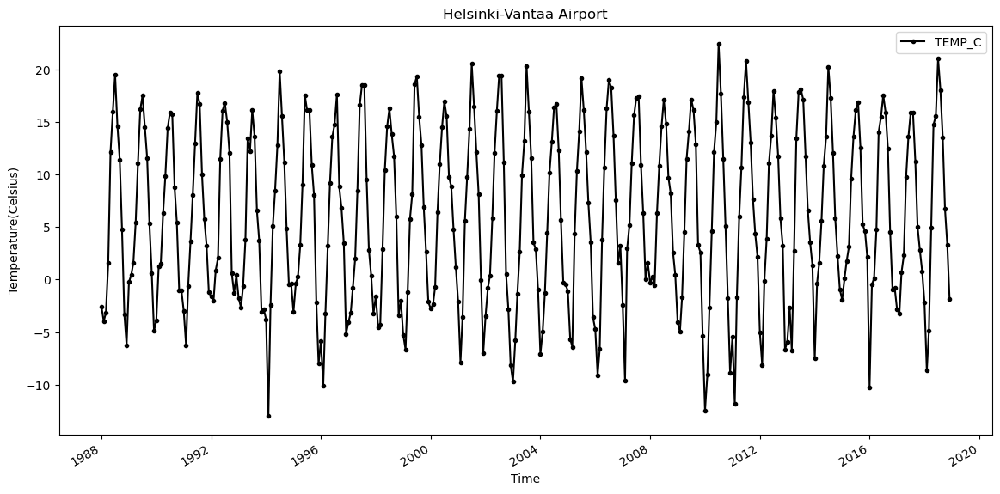

In [14]:
fig = selection.plot(y= 'TEMP_C',
                     figsize=(14,7),
                     title='Helsinki-Vantaa Airport',
                     xlabel='Time',
                     ylabel='Temperature(Celsius)',
                     color='black',
                     marker='o',
                     markersize=3,
                     ls='-',
)

#for color, marker and linestyle(ls), one can use style='ko-'

## Extra
- Create an interactive version of the monthly temperatures using hvPlot!

In [ ]:
import hvplot.pandas

selection.hvplot(y= 'TEMP_C',
                 title='Helsinki-Vantaa Airport',
                 xlabel='Time',
                 ylabel='Temperature(Celsius)',
                )



:Curve   [DATE]   (TEMP_C)

# Final Exercise

## 1. Read in the provided data file using pandas and convert missing data to NA values.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#read in the data

data = pd.read_csv('2315676.txt',
                   delim_whitespace=True,
                   na_values=-9999,
                   parse_dates=['DATE'],
                   usecols = ['DATE', 'TAVG', 'TMAX', 'TMIN'],
                   skiprows=[1],
                   )

data.head()

,DATE,TAVG,TMAX,TMIN
0,1908-01-01,NaN,2.0,-37.0
1,1908-01-02,NaN,6.0,-26.0
2,1908-01-03,NaN,7.0,-27.0
3,1908-01-04,NaN,-3.0,-27.0
4,1908-01-05,NaN,4.0,-36.0


## 2. Fill in the missing values in the TAVG column with your estimates of the average daily temperature. You can then drop any temperatures till missing.

In [2]:
"""  alternative
data['average'] = data[['TMAX','TMIN']].mean(axis=1)
data['TAVG'].fillna(data['average'], inplace=True)
print(data.head(10)) 
"""

#get average temp
data['TAVG_2'] = (data['TMAX'] + data['TMIN']) / 2
data['TAVG_2'].dropna()
data.head()

,DATE,TAVG,TMAX,TMIN,TAVG_2
0,1908-01-01,NaN,2.0,-37.0,-17.5
1,1908-01-02,NaN,6.0,-26.0,-10.0
2,1908-01-03,NaN,7.0,-27.0,-10.0
3,1908-01-04,NaN,-3.0,-27.0,-15.0
4,1908-01-05,NaN,4.0,-36.0,-16.0


## 3. Define and use a function to convert temperatures in Fahrenheit to Celsius.

In [3]:
#function to convert fahrenheit to celsius
def fahr_to_celsius(temp_fahr):
    converted_temp = (temp_fahr - 32) / 1.8
    return converted_temp

In [4]:
fahr_to_celsius(32)

0.0

In [5]:
#apply funcion and convert
data['TEMP_C'] = data['TAVG_2'].apply(fahr_to_celsius)
data.head()

,DATE,TAVG,TMAX,TMIN,TAVG_2,TEMP_C
0,1908-01-01,NaN,2.0,-37.0,-17.5,-27.500000
1,1908-01-02,NaN,6.0,-26.0,-10.0,-23.333333
2,1908-01-03,NaN,7.0,-27.0,-10.0,-23.333333
3,1908-01-04,NaN,-3.0,-27.0,-15.0,-26.111111
4,1908-01-05,NaN,4.0,-36.0,-16.0,-26.666667


## 4. Calculate seasonal average temperatures for each season in every year

In [6]:
#create new column for year and month and set as index
data['YEAR'] = data['DATE'].dt.year
data['MONTH'] = data['DATE'].dt.month
print(data.head())
print(data.tail())

        DATE  TAVG  TMAX  TMIN  TAVG_2     TEMP_C  YEAR  MONTH
0 1908-01-01   NaN   2.0 -37.0   -17.5 -27.500000  1908      1
1 1908-01-02   NaN   6.0 -26.0   -10.0 -23.333333  1908      1
2 1908-01-03   NaN   7.0 -27.0   -10.0 -23.333333  1908      1
3 1908-01-04   NaN  -3.0 -27.0   -15.0 -26.111111  1908      1
4 1908-01-05   NaN   4.0 -36.0   -16.0 -26.666667  1908      1
            DATE  TAVG  TMAX  TMIN  TAVG_2    TEMP_C  YEAR  MONTH
41060 2020-10-03  47.0  51.0   NaN     NaN       NaN  2020     10
41061 2020-10-04  43.0  47.0  37.0    42.0  5.555556  2020     10
41062 2020-10-05  42.0   NaN  37.0     NaN       NaN  2020     10
41063 2020-10-06  45.0  46.0  43.0    44.5  6.944444  2020     10
41064 2020-10-07  47.0  50.0  44.0    47.0  8.333333  2020     10


In [7]:
#create a function to iterrate and return seasons
def seasons(month):
    if month in (12, 1, 2):
        return 'Winter'
    elif month in (3, 4, 5):
        return 'Spring'
    elif month in (6, 7, 8):
        return 'Summer'
    elif month in (9, 10, 11):
        return 'Autumn'
    
#create column that returns seasons from above function
data['SEASON'] = data['MONTH'].apply(seasons)

#new data frame group by year and season and get averages
mean_seasons = data.groupby(['YEAR', 'SEASON'], as_index=False)['TEMP_C'].mean()

mean_seasons

,YEAR,SEASON,TEMP_C
0,1908,Autumn,-1.859217
1,1908,Spring,-2.346743
2,1908,Summer,11.425926
3,1908,Winter,-12.330779
4,1909,Autumn,-0.155827
...,...,...,...
447,2019,Winter,-10.612745
448,2020,Autumn,7.524155
449,2020,Spring,-2.629310
450,2020,Summer,14.048354


## 5. Calculate seasonal average temperatures for the reference period 1951-1980 (e.g., 4 values in total, one for each season)

In [8]:
#create df with the years specified
reference_time = mean_seasons.loc[(mean_seasons['YEAR'] >= 1951) & (mean_seasons['YEAR'] <= 1980)]
reference_time

,YEAR,SEASON,TEMP_C
172,1951,Autumn,-0.228938
173,1951,Spring,-2.789855
174,1951,Summer,11.832729
175,1951,Winter,-13.904321
176,1952,Autumn,-1.852869
...,...,...,...
287,1979,Winter,-14.367284
288,1980,Autumn,-2.588523
289,1980,Spring,-2.469807
290,1980,Summer,13.073671


In [9]:
#getting Season averages
season_avg = reference_time.groupby(['SEASON'], as_index=False)['TEMP_C'].mean()
season_avg

,SEASON,TEMP_C
0,Autumn,-0.895838
1,Spring,-2.655406
2,Summer,12.181666
3,Winter,-13.833583


## 6. Calculate seasonal temperature anomalies for each year

In [10]:
#rename column
season_avg.rename(columns={'TEMP_C': 'SEASON_AVG'}, inplace=True)

#merge the two datasets
temp_anomalies = mean_seasons.merge(season_avg, on='SEASON', how='outer')

#calculate temp andomalies
temp_anomalies['TEMP_ANMLY'] = temp_anomalies['TEMP_C'] - temp_anomalies['SEASON_AVG']

#sort values
temp_anomalies =  temp_anomalies.sort_values(['YEAR', 'SEASON']).reset_index(drop=True)
temp_anomalies = temp_anomalies.set_index('YEAR')
temp_anomalies

,SEASON,TEMP_C,SEASON_AVG,TEMP_ANMLY
YEAR,,,,
1908,Autumn,-1.859217,-0.895838,-0.963379
1908,Spring,-2.346743,-2.655406,0.308663
1908,Summer,11.425926,12.181666,-0.755740
1908,Winter,-12.330779,-13.833583,1.502804
1909,Autumn,-0.155827,-0.895838,0.740012
...,...,...,...,...
2019,Winter,-10.612745,-13.833583,3.220838
2020,Autumn,7.524155,-0.895838,8.419993
2020,Spring,-2.629310,-2.655406,0.026096


In [11]:
#create separate groups for the seasons

winter = temp_anomalies.loc[temp_anomalies['SEASON'] == 'Winter']
spring = temp_anomalies.loc[temp_anomalies['SEASON'] == 'Spring']
summer = temp_anomalies.loc[temp_anomalies['SEASON'] == 'Summer']
autumn = temp_anomalies.loc[temp_anomalies['SEASON'] == 'Autumn']

winter_temps = winter['TEMP_ANMLY']
spring_temps = spring['TEMP_ANMLY']
summer_temps = summer['TEMP_ANMLY']
autumn_temps = autumn['TEMP_ANMLY']


In [12]:
#find min and max seasonal temp to use as limits
min_temp = min(winter_temps.min(), spring_temps.min(), summer_temps.min(), autumn_temps.min())
max_temp = max(winter_temps.max(), spring_temps.max(), summer_temps.max(), autumn_temps.max())

min_temp = min_temp - 5.0
max_temp = max_temp + 5.0
print(min_temp, max_temp)

-14.610860967938057 13.419993010210401


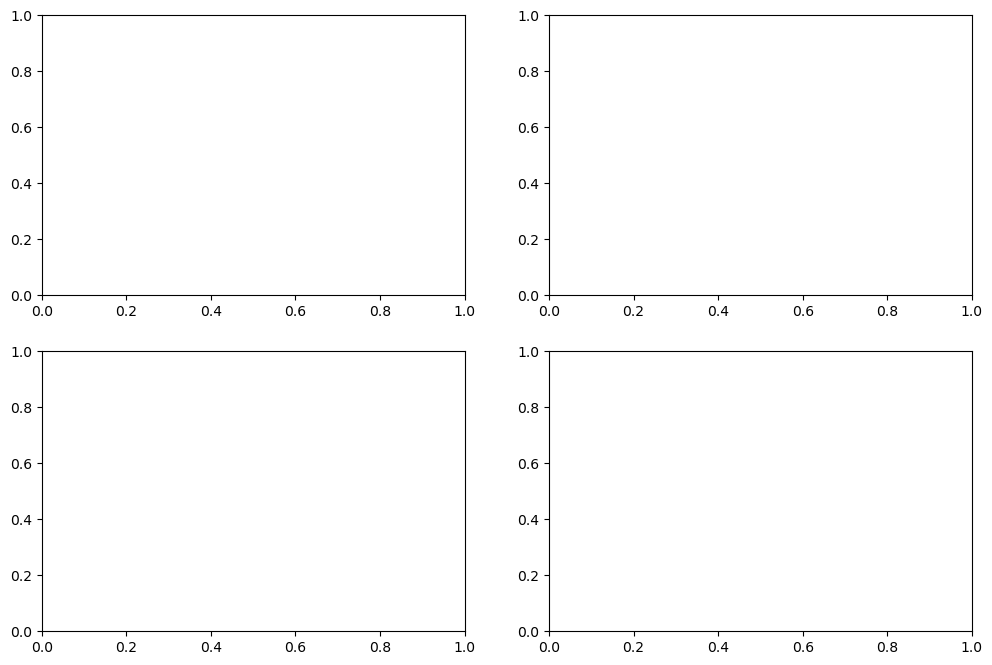

In [13]:
# create new figure with subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

#rename axes for easy use
ax11 = axes[0][0]
ax12 = axes[0][1]
ax21 = axes[1][0]
ax22 = axes[1][1]

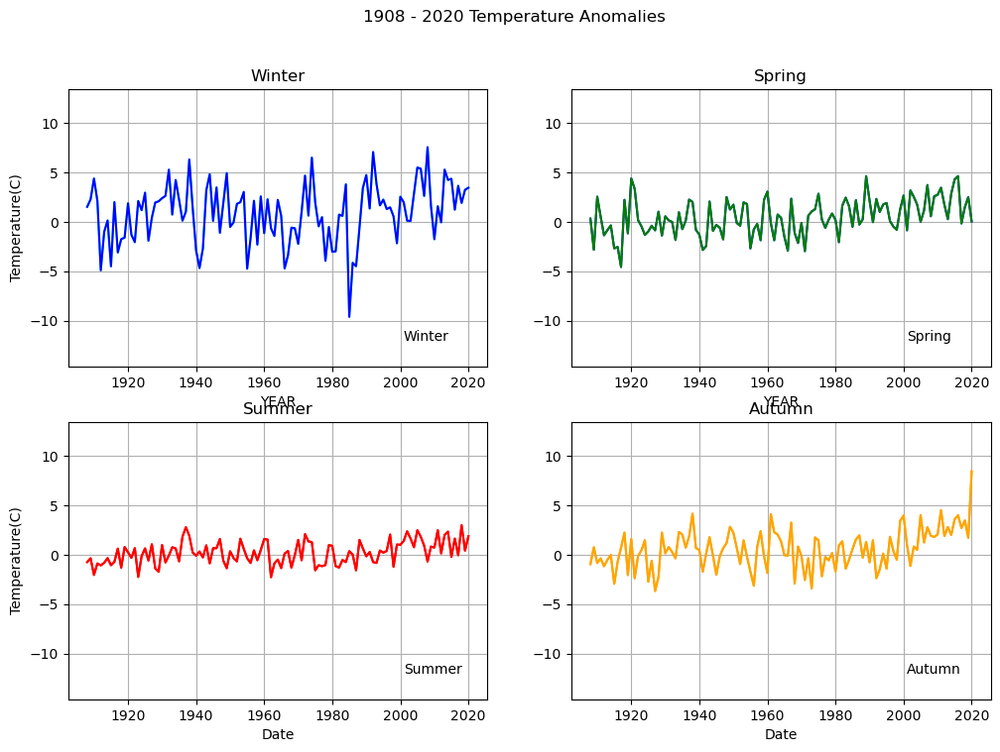

In [17]:
#set line width
line_width = 1.5

#plot the data
winter_temps.plot(ax=ax11, c = 'blue', lw=line_width, ylim=[min_temp, max_temp], title='Winter', grid=True)
spring_temps.plot(ax=ax12, c = 'green', lw=line_width, ylim=[min_temp, max_temp], title='Spring', grid=True)
summer_temps.plot(ax=ax21, c = 'red', lw=line_width, ylim=[min_temp, max_temp], title='Summer', grid=True)
autumn_temps.plot(ax=ax22, c = 'orange', lw=line_width, ylim=[min_temp, max_temp], title='Autumn', grid=True)

#set title
fig.suptitle('1908 - 2020 Temperature Anomalies')

#axis labels
ax21.set_xlabel('Date')
ax22.set_xlabel('Date')
ax11.set_ylabel('Temperature(C)')
ax21.set_ylabel('Temperature(C)')

'''
#season label text
ax11.text(2001, -12, 'Winter')
ax12.text(2001, -12, 'Spring')
ax21.text(2001, -12, 'Summer')
ax22.text(2001, -12, 'Autumn')'''


#display plot
fig

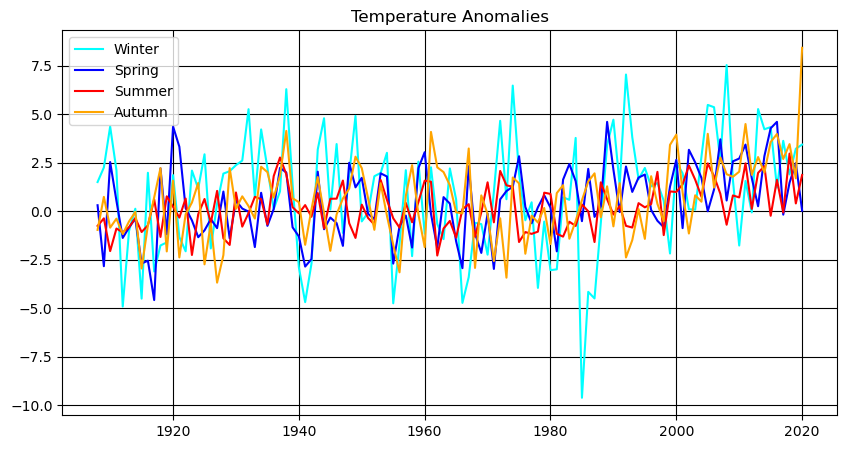

In [15]:
#try and plot all on one axis
import hvplot.pandas

plt.figure(figsize = (10,5))


plt.title('Temperature Anomalies')
plt.plot(winter_temps, c = 'cyan', label = 'Winter')
plt.plot(spring_temps, c = 'blue', label = 'Spring')
plt.plot(summer_temps, c = 'red', label = 'Summer')
plt.plot(autumn_temps, c = 'orange', label = 'Autumn')

plt.legend()
plt.grid(True, c = 'k')
plt.show()

In [16]:
winter_temps.hvplot(y='TEMP_ANMLY')

:Curve   [YEAR]   (TEMP_ANMLY)

In [15]:
import hvplot.pandas

selection.hvplot(y= 'TEMP_C',
                 title='Helsinki-Vantaa Airport',
                 xlabel='Time',
                 ylabel='Temperature(Celsius)',
                )



:Curve   [DATE]   (TEMP_C)